## Predict Student Performance from Game Play

Данная работа инициированна соревнованием на платформе Kaggle.

Цель соревнования - спрогнозировать успеваемость учащихся во время обучения на основе игр в режиме реального времени. Данная работа призвана помочь продвинуть исследования в области методов отслеживания знаний для обучения, основанного на играх. Проект направлен на поддержку разработчиков развивающих игр, чтобы создать более эффективный опыт обучения для студентов.

Ссылка на соревнование: https://www.kaggle.com/competitions/predict-student-performance-from-game-play

In [1]:
import pandas as pd

import warnings
warnings.filterwarnings('ignore')

import matplotlib.pyplot as plt
plt.style.use('default')
import seaborn as sns
import plotly.express as px

from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics

import catboost as cat

import optuna

### Загрузка данных

In [2]:
# загрузим исходный датасет с данными для каждоый сессии игры
train = pd.read_csv('data/train.csv')
train.head()

,session_id,index,elapsed_time,event_name,name,level,page,room_coor_x,room_coor_y,screen_coor_x,screen_coor_y,hover_duration,text,fqid,room_fqid,text_fqid,fullscreen,hq,music,level_group
0,20090312431273200,0,0,cutscene_click,basic,0,NaN,-413.991405,-159.314686,380.0,494.0,NaN,undefined,intro,tunic.historicalsociety.closet,tunic.historicalsociety.closet.intro,NaN,NaN,NaN,0-4
1,20090312431273200,1,1323,person_click,basic,0,NaN,-413.991405,-159.314686,380.0,494.0,NaN,"Whatcha doing over there, Jo?",gramps,tunic.historicalsociety.closet,tunic.historicalsociety.closet.gramps.intro_0_...,NaN,NaN,NaN,0-4
2,20090312431273200,2,831,person_click,basic,0,NaN,-413.991405,-159.314686,380.0,494.0,NaN,Just talking to Teddy.,gramps,tunic.historicalsociety.closet,tunic.historicalsociety.closet.gramps.intro_0_...,NaN,NaN,NaN,0-4
3,20090312431273200,3,1147,person_click,basic,0,NaN,-413.991405,-159.314686,380.0,494.0,NaN,I gotta run to my meeting!,gramps,tunic.historicalsociety.closet,tunic.historicalsociety.closet.gramps.intro_0_...,NaN,NaN,NaN,0-4
4,20090312431273200,4,1863,person_click,basic,0,NaN,-412.991405,-159.314686,381.0,494.0,NaN,"Can I come, Gramps?",gramps,tunic.historicalsociety.closet,tunic.historicalsociety.closet.gramps.intro_0_...,NaN,NaN,NaN,0-4


### Перечень признаков в исходном датасете train


    session_id - идентификатор сеанса, в котором произошло событие
    index - индекс события для сессии
    elapsed_time - сколько времени прошло (в миллисекундах) между началом сеанса и моментом записи события
    event_name - тип события
    name - имя события (например, определяет, открывает или закрывает ли блокнот Notebook_click)
    level - на каком уровне игры произошло событие (от 0 до 22)
    page - номер страницы блокнота (только для событий, связанных с блокнотом)
    room_coor_x - координаты клика относительно игровой комнаты (только для кликов)
    room_coor_y - координаты клика относительно игровой комнаты (только для кликов)
    screen_coor_x - координаты клика относительно экрана игрока (только для кликов)
    screen_coor_y - координаты клика относительно экрана игрока (только для кликов)
    hover_duration - как долго (в миллисекундах) происходило наведение (только для событий наведения)
    text - текст, который игрок видит во время этого события
    fqid - идентификатор события
    room_fqid - идентификатор комнаты, в которой произошло событие
    text_fqid - идентификатор текста
    fullscreen - находится ли игра в полноэкранном режиме
    hq - включено ли улучшенное качество отображения
    music - включена или выключена музыка в игре
    level_group - к какой группе уровней — и группе вопросов — принадлежит эта строка (0-4, 5-12, 13-22)


In [3]:
# сразу загрузим метки, чтобы посмотреть, что нужно предсказать
train_labels = pd.read_csv('data/train_labels.csv')
train_labels.head()

,session_id,correct
0,20090312431273200_q1,1
1,20090312433251036_q1,0
2,20090314121766812_q1,1
3,20090314363702160_q1,1
4,20090314441803444_q1,1


---

Перед нами стоит задача классификации. Классифицировать нужно результат ответа на вопрос по игре. После каждого игрового сеанса пользователь отвечает на 18 вопросов. Самих вопросов мы не знаем по умолчанию, но для тренировочного (на самом деле ещё не тренировочного) набора данных известно правильно или нет игрок ответил на вопрос.

Исходными данными по сути является лог игры, это ещё не тренировочный набор. Самый главный вопрос для начала - как сгруппировать данные, чтобы подать их для обучения модели. Получается, что для каждого вопроса, мы должны дать совокупно одинаковые данные по сеансу, так как мы не знаем к какому этапу игры относится вопрос. Эти данные - это "картина сеанса", модель будет обучаться по "картине сеанса" и попытается предсказать, корректно ли отвечает пользователь на вопрос. Для того, чтобы модель была эффективной, необходимо, чтобы для каждого вопроса было достаточно показательных признаков в "картине".

---

### Исследование данных

Начнем с анализа "лога игры", который представлен в таблице train

Сначала сделаем преобразование типов, так как для 13 млн. записей вопросы размеров таблицы, становится чувствителным.

In [4]:
train['index'] = train['index'].astype('int16')
train['level'] = train['level'].astype('int8')
train['elapsed_time'] = train['elapsed_time'].astype('int32')

Проверим данные на наличие дублей строк

In [5]:
# создаем список наименований всех столбцов
list_columns = list(train.columns) 
# создаем маску с помощью метода duplicated
mask = train.duplicated(subset=list_columns) 
df_duplicates = train[mask]
print(f'Число найденных дубликатов: {df_duplicates.shape[0]}')

Число найденных дубликатов: 0


Дублей нет.

Теперь оценим количество пропусков в столбцах.

In [6]:
# сфоримруем DataFrame с помощью метода isnull()
cols_null = train.isnull().mean() * train.shape[0]
cols_null_percent = train.isnull().mean() * 100
cols_with_null = cols_null_percent[cols_null_percent > 0].sort_values(ascending=False)
display(cols_with_null)

fullscreen        100.000000
hq                100.000000
music             100.000000
page               97.838611
hover_duration     92.403818
text               63.512874
text_fqid          63.512464
fqid               31.574172
room_coor_x         7.865670
room_coor_y         7.865670
screen_coor_x       7.865670
screen_coor_y       7.865670
dtype: float64

Жаль, что нет данных по категориям *fullscreen*, *hq* и *music*, создаётся впечатление, что эти признаки могут влиять на результат игры.

Пропуски в остальных признаках объясняются их связью с типом события. Например признак *page* актуален только для событий связанных с открытием блокнота.

In [7]:
# удаляем столбцы, которые пока что не содержат данных
train = train.drop(['fullscreen', 'hq', 'music'], axis=1)

---

In [8]:
# посмотрим на количество уникальных сеансов
print(f"Всего для исследования предоставлены данные по {len(train['session_id'].unique())} сеансам")

Всего для исследования предоставлены данные по 11779 сеансам


---

Посмотрим на возможные значения признаков, чтобы понять, как их можно преобразовать и использовать при обучении модели.

In [9]:
# посмотрим на возможные значения для признака page
train['page'].value_counts()

5.0    51154
1.0    50714
6.0    45417
4.0    44207
0.0    37232
3.0    31350
2.0    24672
Name: page, dtype: int64

Игровой блокнот, в который делаются записи о событиях и целях в игре содержит 7 страниц. В блокнот записываются задания и важные выводы по ходу игры, вопросы, на которые в итоге будет отвечать игрок, навернякак тесно свсязаны с тем, что записывается в блокнот.

---

In [10]:
# посмотрим на возможные значения для признака text
train['text'].value_counts()

undefined                                           178294
\u00f0\u0178\u02dc\u0090                             24383
Hey!                                                 23724
I should go to the Capitol and tell Mrs. M!          20074
This is perfect for the exhibit.                     19987
                                                     ...  
Sorry for the delay, Boss.                               1
And where's your grampa?                                 1
Who is Teddy?                                            1
AND I know who took Teddy!                               1
Meet me back in my office and we'll get started!         1
Name: text, Length: 594, dtype: int64

In [11]:
# пробежимся по всем уникальным значениям признака текст
for text in train[train['text'].isna() == False]['text'].unique():
    print(text)

undefined
Whatcha doing over there, Jo?
Just talking to Teddy.
I gotta run to my meeting!
Can I come, Gramps?
Sure thing, Jo. Grab your notebook and come upstairs!
See you later, Teddy.
I get to go to Gramps's meeting!
Now where did I put my notebook?
\u00f0\u0178\u02dc\u00b4
I love these photos of me and Teddy!
Found it!
Gramps is in trouble for losing papers?
This can't be right!
Gramps is a great historian!
Hmm. Button's still not working.
Let's get started. The Wisconsin Wonders exhibit opens tomorrow!
Who wants to investigate the shirt artifact?
Not Leopold here. He's been losing papers lately.
Hey!
It's true, they do keep going missing lately.
See?
Besides, I already figured out the shirt.
It's a women's basketball jersey!
That settles it.
Wells, finish up your report.
Leopold, why don't you help me set up in the Capitol?
We need to talk about that missing paperwork.
Will do, Boss.
Hey Jo, let's take a look at the shirt!
Your grampa is waiting for you in the collection room.
Why 

Признак **text** хранит диалоговые единицы. 2 наиболее часто встречающихся элемента как будто бы носят технический характер. Инетересно, что есть такие элементы, которые встречались только одному пользователю. Это сложный для обработки признак, его можно использовать в савокупности, чтобы увидеть сколько текстовых единиц видел каждый пользователь и сколько времени тратил на чтение.

---

In [12]:
# посмотрим на возможные значения для признака fqid
train['fqid'].value_counts()

worker           939555
archivist        563259
gramps           561000
wells            394234
toentry          392221
                  ...  
block_badge         854
need_glasses        675
block_badge_2       508
fox                 166
block_1              25
Name: fqid, Length: 127, dtype: int64

**fqid** - важный признак, он указывает на персонажа или происходящее событие. Можно узнать сколько раз в рамках сеанса было взаимодейтсиве с тем или иным персонажем или событием, и сколько савокупно было зактрачено времени.

---

In [13]:
# посмотрим на возможные значения для признака text_fqid
train['text_fqid'].value_counts()

tunic.historicalsociety.cage.confrontation               333363
tunic.wildlife.center.crane_ranger.crane                 235368
tunic.historicalsociety.frontdesk.archivist.newspaper    214637
tunic.historicalsociety.entry.groupconvo                 213592
tunic.wildlife.center.wells.nodeer                       199978
                                                          ...  
tunic.wildlife.center.fox.concern                           111
tunic.drycleaner.frontdesk.block_0                          106
tunic.historicalsociety.entry.gramps.hub                     21
tunic.humanecology.frontdesk.block_1                          8
tunic.drycleaner.frontdesk.block_1                            3
Name: text_fqid, Length: 126, dtype: int64

Далее нужно посмотреть на связь между text и text_fqid отдельно. Количестово уникальных единиц у данных признаков схоже.

---

In [14]:
# посмотрим на возможные значения для признака index
train['index'].value_counts()

0        11769
11       11769
1        11769
25       11769
24       11769
         ...  
10437        1
10438        1
10439        1
10440        1
20473        1
Name: index, Length: 20348, dtype: int64

Так как счет идентификаторов событий идйт на десятки тысяч, то использование каждого идентификатора не имеет смысла. Но вот определение максимального из них, может помочь, так же можно взять медианный идентификатор и сравнивать пользователей по времени достижения.

Количество сеансов и количество пользователей, проходивших через событие с индексом 0, отличается. Где-то потерялись информация по 10 сеансам.

---

In [15]:
# посмотрим на возможные значения для признака elapsed_time
train['elapsed_time'].value_counts()

0          11781
1014          67
1016          60
949           47
1032          46
           ...  
2828604        1
2827274        1
2823038        1
2822271        1
5487952        1
Name: elapsed_time, Length: 3804019, dtype: int64

Странно, что с этапа 0 мс. начинали 11781 пользователь, но в данных есть только 11779 уникальных сеансов. Это говорит, что были пользовтели, которые перезапускали игру в рамках одного сеанса или о том, что есть неточностти в данных.

Признак времени, затраченного на достижение того или иного этапа игры является одним из ключевых.

**!** Имеет смысл добавить признак, который покажет время потраченное на конкретное действие.

---

In [16]:
# посмотрим на возможные значения для признака event_name
train['event_name'].value_counts()

navigate_click        5687896
person_click          3024847
cutscene_click        1351732
object_click          1099670
object_hover           529116
map_hover              471621
notification_click     324106
notebook_click         284746
map_click              258714
observation_click      106260
checkpoint              35503
Name: event_name, dtype: int64

Всего видим 11 типов событий, чаще всего происходит событие navigate_click, что не удивительно. Количество событий которое возникало в рамках каждого сеанса является потенциально важным признаком.

---

In [17]:
# посмотрим на возможные значения для признака name
train['name'].value_counts()

undefined    6377305
basic        6324016
close         339093
open          118125
prev            9834
next            5838
Name: name, dtype: int64

Пока сложно что-то сказать про этот признак. Он связан с блокнотом.

---

In [18]:
# посмотрим на возможные значения для признака room_fqid
train['room_fqid'].value_counts()

tunic.historicalsociety.entry              1816202
tunic.wildlife.center                      1510888
tunic.historicalsociety.cage               1178391
tunic.library.frontdesk                    1075322
tunic.historicalsociety.frontdesk           972235
tunic.historicalsociety.stacks              900673
tunic.historicalsociety.closet_dirty        788096
tunic.humanecology.frontdesk                662645
tunic.historicalsociety.basement            585058
tunic.kohlcenter.halloffame                 547779
tunic.library.microfiche                    497924
tunic.drycleaner.frontdesk                  492050
tunic.historicalsociety.collection          478700
tunic.historicalsociety.closet              429854
tunic.flaghouse.entry                       416942
tunic.historicalsociety.collection_flag     227017
tunic.capitol_1.hall                        223793
tunic.capitol_0.hall                        208670
tunic.capitol_2.hall                        161972
Name: room_fqid, dtype: int64

В игре есть 20 различных локаций. Нужно смотреть как часто посещается каждая локация в рамках сеанса и сколько времени на это тратится.

---

In [19]:
# посмотрим на возможные значения для признака level_group
train['level_group'].value_counts()

13-22    6746397
5-12     4433127
0-4      1994687
Name: level_group, dtype: int64

In [20]:
# посмотрим на возможные значения для признака level_group
train['level'].value_counts()

18    1757959
6     1065231
21    1056593
11     972085
16     648472
7      638179
15     611574
19     607286
17     603008
3      575214
9      568681
20     565933
2      495563
8      445325
13     411319
1      364343
0      345275
5      333652
14     272108
10     226174
4      214292
22     212145
12     183800
Name: level, dtype: int64

Больше всего событий происходит на последней группе уровней.

---

Не проверенными остались признаки показывающие расположение курсора мыши в момент фиксации события. Из координат нужно формировать какую-то картину поведения кликов. Может быть тут помогут методы понижения размерности, но это не точно. Сложно понять, как из несколько тысяч значений координа расположения курсора мыши сделать признак для общей картины сеанса.

### Создание новых признаков

Далее мы будем работать со значениями одного сеанса, сформировав конечный перечень признаков, которые будут отображать "картину сеанса" можно будет повторить операции для остальных.

Выбирем сеанс, в котором больше всего значений.

In [21]:
train.groupby(by=['session_id'])['index'].count().sort_values(ascending=False).head(3)

session_id
20110310463989760    19032
20110515090304556     6000
21110313432157404     5435
Name: index, dtype: int64

Конечно подозрительно, что у первого по количеству действий сеанса такой разрыв со следующими. Возможно в процессе обработки выявятся аномалии, что тоже хорошо.

In [22]:
one_session_df = train[train['session_id'] == 20110310463989760].copy()
one_session_df.head(3)

,session_id,index,elapsed_time,event_name,name,level,page,room_coor_x,room_coor_y,screen_coor_x,screen_coor_y,hover_duration,text,fqid,room_fqid,text_fqid,level_group
1159591,20110310463989760,0,0,cutscene_click,basic,0,NaN,-279.991405,-117.314686,514.0,452.0,NaN,undefined,intro,tunic.historicalsociety.closet,tunic.historicalsociety.closet.intro,0-4
1159592,20110310463989760,1,599,person_click,basic,0,NaN,-279.991405,-117.314686,514.0,452.0,NaN,"Whatcha doing over there, Jo?",gramps,tunic.historicalsociety.closet,tunic.historicalsociety.closet.gramps.intro_0_...,0-4
1159593,20110310463989760,2,816,person_click,basic,0,NaN,-279.991405,-117.314686,514.0,452.0,NaN,Just talking to Teddy.,gramps,tunic.historicalsociety.closet,tunic.historicalsociety.closet.gramps.intro_0_...,0-4


Первым призаком, который надо сформировать, это время потраченное на действие. Дадим этому признаку наименование *event_time*. 

В данных есть призак *elapsed_time*, он показывате сколько времени прошло между началом сеанса и моментом записи события. Для каждого сеанса время должно идти на увеличение. Если следующее событие будет иметь меньшее значение *elapsed_time*, чем предыдущее, то в результате мы получим отрицательное значание для *event_time*. Значит, нужно будет в рамках каждой сессии отсортировать строки по *elapsed_time*.

In [23]:
# сортируем DataFrame по elapsed_time
one_session_df.sort_values(by='elapsed_time', inplace=True) 

In [24]:
# создаем заготовку для новго признака event_time
one_session_df['event_time'] = one_session_df['elapsed_time']
# с помощью функции diff вычисляем разницу между соседними строками с event_time
one_session_df['event_time'] = one_session_df['event_time'].diff()
# заполним пропуски нулями
one_session_df['event_time'] = one_session_df['event_time'].fillna(0)

In [25]:
# смотрим на результат
one_session_df[['session_id', 'elapsed_time', 'event_time']].head()

,session_id,elapsed_time,event_time
1159591,20110310463989760,0,0.0
1159592,20110310463989760,599,599.0
1159593,20110310463989760,816,217.0
1159594,20110310463989760,1032,216.0
1159595,20110310463989760,1248,216.0


In [26]:
# проверим, нет ли отрицательных значений времени
one_session_df[one_session_df['event_time'] < 0].shape[0]

0

Отлично, теперь у нас есть признак, который показывает, сколько времени тратилось на каждое действие.

Теперь перейдем непосредственно к созданию "картины сеанса". Начнем с признака *page*, в дневнике всего 7 страниц. Мы можем посчитать суммарное количество действий связанных с кажой страницей, а так же суммарное время, которое затрачено как на все события свзанные с дневником, так и для каждой страницы.

In [27]:
# создадим заготовку для итогового DataFrame
result_df = pd.DataFrame()
result_df['session_id'] = [one_session_df['session_id'].values[0]]
result_df

,session_id
0,20110310463989760


In [28]:
# посмотрим на количество действий связанных со страницами
page_count = one_session_df.groupby(by='page')['index'].count()
page_count

page
0.0    598
1.0    756
2.0    658
3.0    576
4.0      2
5.0      2
6.0     13
Name: index, dtype: int64

In [29]:
# в цикле создадим признаки и запишим в них значения
for page in page_count.index:
    page = int(page)
    result_df[f'page_{page}_count'] = [page_count[page]]

result_df

,session_id,page_0_count,page_1_count,page_2_count,page_3_count,page_4_count,page_5_count,page_6_count
0,20110310463989760,598,756,658,576,2,2,13


In [30]:
# посмотрим на количество времени затраченное на действия с каждой страницей дневника
page_time = one_session_df.groupby(by='page')['event_time'].sum()
# посмотрим на суммарное количество времени затраченное на действия со страницами дневника
page_all_time = page_time.values.sum()

print(page_time)
print(f'Всего на взаимодействие с дневником было потрачено {page_all_time} миллисекунд')

page
0.0     12815.0
1.0     16841.0
2.0     22820.0
3.0     12989.0
4.0     14307.0
5.0      5426.0
6.0    122332.0
Name: event_time, dtype: float64
Всего на взаимодействие с дневником было потрачено 207530.0 миллисекунд


In [31]:
# создадим новые признаки и запишем в них значения
result_df['page_all_time'] = [(page_all_time)]

for page in page_time.index:
    page = int(page)
    result_df[f'page_{page}_time'] = [page_time[page]]

Признаки связанные со страницами дневника сфоримрованы, теперь перейдем к следующему признаку - *text*. Попробуем вывести савокупное количество разных реплик, которые видел игрок, общее затраченное время на реплики, а так же попробуем эти же признаки посмотреть по этапам игры (*level_group*). Пока не будем вводить признаки для каждого уровня, ограниччимся именно *level_group*

In [32]:
# создадим признак с количеством разных реплик
result_df['text_count'] = [len(one_session_df['text'].unique())]
# создадим признак с общим временем, затраченным на реплики
text_all_time = one_session_df[one_session_df['text'].isna() == False]['event_time'].sum()
result_df['text_all_time'] = [text_all_time]

# создадим признаки количества текста для каждого этапа игры
text_level_count = one_session_df.groupby(by='level_group')['index'].count()

for level in one_session_df['level_group'].unique():
    result_df[f'text_{level}_level_count'] = [text_level_count[level]]

# создадим признаки затраченного на текст времени для каждого этапа игры
text_level_time = one_session_df.groupby(by='level_group')['event_time'].sum()

for level in one_session_df['level_group'].unique():
    result_df[f'text_{level}_level_time'] = [text_level_time[level]]

Добавим общее количество событий, через которое прошел игрок, а так же сколько всего времени игрок потратил на сеанс.

In [33]:
# создадим признак показывающий количество индексов событий, через которые прошел пользователь
result_df['index_count'] = [len(one_session_df['index'].unique())]

In [34]:
# создадим признак показывающий затраченное время на сессию
result_df['all_time'] = one_session_df['elapsed_time'].max()

В данных есть признак *hover_duration* он показвыает время наведения курсорк для событий связанных с наведением.

In [35]:
# создадим признаки, показывающие минимальное, среднее, медианное и максимальное время наведения
result_df['min_hover_duration'] = one_session_df['hover_duration'].min()
result_df['mean_hover_duration'] = one_session_df['hover_duration'].mean()
result_df['median_hover_duration'] = one_session_df['hover_duration'].median()
result_df['max_hover_duration'] = one_session_df['hover_duration'].max()

Перейдем к событиям связанным с игровыми комнатами и текстом, который видел игрок на экаране во время диалогов.

In [36]:
# создадим признак показывающий сколько событий связаны с каждой из игровых комнат
room_count = one_session_df.groupby(by='room_fqid')['index'].count()

for room in room_count.index:
    result_df[f'{room}_count'] = [room_count[room]]
    
# создадим признак показывающий сколько времени игрок потратилна каждую из игровых комнат
room_time = one_session_df.groupby(by='room_fqid')['event_time'].sum()

for room in room_time.index:
    result_df[f'{room}_time'] = [room_time[room]]

In [37]:
# создадим признак, показывающий количество записей для text_fqid
result_df['text_fqid_count'] = one_session_df['text_fqid'].count()

Преобразуем признаки *name* и *event_name*

In [38]:
# создадим признак показывающий сколько событий связано с игроком
name_count = one_session_df.groupby(by='name')['index'].count()

for name in name_count.index:
    result_df[f'{name}_count'] = [name_count[name]]

# создадим признак показывающий сколько времени потрачено на каждое событие
name_time = one_session_df.groupby(by='name')['event_time'].sum()

for name in name_time.index:
    result_df[f'{name}_time'] = [name_time[name]]

In [39]:
# создадим признак показывающий сколько типов обытий связано с игроком
event_name_count = one_session_df.groupby(by='event_name')['index'].count()

for event_name in event_name_count.index:
    result_df[f'{event_name}_count'] = [event_name_count[event_name]]

In [40]:
# создадим признак показывающий сколько времени потрачено на каждый тип события
event_name_time = one_session_df.groupby(by='event_name')['event_time'].sum()

for event_name in event_name_time.index:
    result_df[f'{event_name}_time'] = [event_name_time[event_name]]

In [41]:
# посмотрим на итоговое количество признаков
result_df.shape

(1, 103)

---

Пока что остановимся на генерации новых признаков, попробуем составить дата-фрейм с данными о всех сессиях.

In [42]:
# запускаем цикл для каждой сессии, который повторит все действия, которые были сделаны ранее для сессии 20110310463989760
# обернем все действия в функцию
def make_features(df):
    
    # фомрируем список всех номеров сессий
    session_id_list = list(df['session_id'].unique())
    
    # создадим список столбцов заренее, это нужно для того, чтобы порядок признаков
    # у всех датафреймов, подающихся на вход, был одинаковый, иначе модели могут ломаться
    reslut_df_columns = ['session_id', 'min_hover_duration', 'mean_hover_duration', 'median_hover_duration',
                         'max_hover_duration', 'text_0-4_level_count', 'text_5-12_level_count', 'text_13-22_level_count',
                         'unique_text_0-4_level_count', 'unique_text_5-12_level_count', 'unique_text_13-22_level_count',
                         'text_0-4_level_time', 'text_5-12_level_time', 'text_13-22_level_time', 'tunic.capitol_0.hall_count',
                         'tunic.capitol_1.hall_count', 'tunic.capitol_2.hall_count', 'tunic.drycleaner.frontdesk_count',
                         'tunic.flaghouse.entry_count', 'tunic.historicalsociety.basement_count', 'tunic.historicalsociety.cage_count',
                         'tunic.historicalsociety.closet_count', 'tunic.historicalsociety.closet_dirty_count',
                         'tunic.historicalsociety.collection_count', 'tunic.historicalsociety.collection_flag_count',
                         'tunic.historicalsociety.entry_count', 'tunic.historicalsociety.frontdesk_count',
                         'tunic.historicalsociety.stacks_count', 'tunic.humanecology.frontdesk_count', 
                         'tunic.kohlcenter.halloffame_count', 'tunic.library.frontdesk_count', 'tunic.library.microfiche_count',
                         'tunic.wildlife.center_count', 'tunic.capitol_0.hall_time', 'tunic.capitol_1.hall_time',
                         'tunic.capitol_2.hall_time', 'tunic.drycleaner.frontdesk_time', 'tunic.flaghouse.entry_time',
                         'tunic.historicalsociety.basement_time', 'tunic.historicalsociety.cage_time',
                         'tunic.historicalsociety.closet_time', 'tunic.historicalsociety.closet_dirty_time',
                         'tunic.historicalsociety.collection_time', 'tunic.historicalsociety.collection_flag_time',
                         'tunic.historicalsociety.entry_time', 'tunic.historicalsociety.frontdesk_time',
                         'tunic.historicalsociety.stacks_time', 'tunic.humanecology.frontdesk_time', 'tunic.kohlcenter.halloffame_time',
                         'tunic.library.frontdesk_time', 'tunic.library.microfiche_time', 'tunic.wildlife.center_time',
                         'text_fqid_count', 'basic_count', 'close_count', 'undefined_count', 'basic_time', 'close_time',
                         'undefined_time', 'checkpoint_count', 'cutscene_click_count', 'map_click_count', 'map_hover_count',
                         'navigate_click_count', 'notification_click_count', 'object_click_count', 'object_hover_count',
                         'observation_click_count', 'person_click_count', 'checkpoint_time', 'cutscene_click_time', 'map_click_time',
                         'map_hover_time', 'navigate_click_time', 'notification_click_time', 'object_click_time', 'object_hover_time',
                         'observation_click_time', 'person_click_time', 'page_0_count', 'page_1_count', 'page_2_count', 'page_3_count', 
                         'page_4_count', 'page_5_count', 'page_6_count', 'page_0_time', 'page_1_time', 'page_2_time', 'page_3_time', 
                         'page_4_time', 'page_5_time', 'page_6_time', 'next_count', 'open_count', 'prev_count', 'next_time', 'open_time', 
                         'prev_time', 'notebook_click_count', 'notebook_click_time']
    
    # создадим заготовку для итогового DataFrame
    result_df = pd.DataFrame(columns=reslut_df_columns)

    for session in session_id_list:
        one_session_df = df[df['session_id'] == session].copy()
        
        temp_result_df = pd.DataFrame()
        temp_result_df['session_id'] = [one_session_df['session_id'].values[0]]
        
        # сортируем DataFrame по elapsed_time
        one_session_df.sort_values(by='elapsed_time', inplace=True)
        # создаем заготовку для новго признака event_time
        one_session_df['event_time'] = one_session_df['elapsed_time']
        # с помощью функции diff вычисляем разницу между соседними строками с event_time
        one_session_df['event_time'] = one_session_df['event_time'].diff()
        # заполним пропуски нулями
        one_session_df['event_time'] = one_session_df['event_time'].fillna(0)
        
        
        # посмотрим на количество взаимодействий с каждой страницей дневника
        page_count = one_session_df.groupby(by='page')['index'].count()
        # в цикле создадим признаки и запишим в них значения
        for page in page_count.index:
            page = int(page)
            temp_result_df[f'page_{page}_count'] = [page_count[page]]
        
        # посмотрим на количество времени затраченное на действия с каждой страницей дневника
        page_time = one_session_df.groupby(by='page')['event_time'].sum()
        # в цикле создадим признаки и запишим в них значения
        for page in page_time.index:
            page = int(page)
            temp_result_df[f'page_{page}_time'] = [page_time[page]]
            
            
        # создадим признаки, показывающие минимальное, среднее, медианное и максимальное время наведения
        temp_result_df['min_hover_duration'] = one_session_df['hover_duration'].min()
        temp_result_df['mean_hover_duration'] = one_session_df['hover_duration'].mean()
        temp_result_df['median_hover_duration'] = one_session_df['hover_duration'].median()
        temp_result_df['max_hover_duration'] = one_session_df['hover_duration'].max()
        

        # создадим признаки количества текста для каждого этапа игры
        text_level_count = one_session_df.groupby(by='level_group')['text'].count()
        # в цикле создадим признаки и запишим в них значения
        for level in one_session_df['level_group'].unique():
            temp_result_df[f'text_{level}_level_count'] = [text_level_count[level]]
        # создадим признаки количества текста для каждого этапа игры
        text_level_count = one_session_df.groupby(by='level_group')['text'].nunique()
        # в цикле создадим признаки и запишим в них значения
        for level in one_session_df['level_group'].unique():
            temp_result_df[f'unique_text_{level}_level_count'] = [text_level_count[level]]

        # создадим признаки затраченного на текст времени для каждого этапа игры
        text_level_time = one_session_df[one_session_df['text'].isna() == False].groupby(by='level_group')['event_time'].sum()
        # в цикле создадим признаки и запишим в них значения
        for level in one_session_df['level_group'].unique():
            temp_result_df[f'text_{level}_level_time'] = [text_level_time[level]]
            
        
        # создадим признак показывающий сколько событий связаны с каждой из игровых комнат
        room_count = one_session_df.groupby(by='room_fqid')['index'].count()
        # в цикле создадим признаки и запишим в них значения
        for room in room_count.index:
            temp_result_df[f'{room}_count'] = [room_count[room]]
            
        # создадим признак показывающий сколько времени игрок потратил на каждую из игровых комнат
        room_time = one_session_df.groupby(by='room_fqid')['event_time'].sum()
        # в цикле создадим признаки и запишим в них значения
        for room in room_time.index:
            temp_result_df[f'{room}_time'] = [room_time[room]]
            
            
        # создадим признак, показывающий количество записей для text_fqid
        temp_result_df['text_fqid_count'] = one_session_df['text_fqid'].count()
            
            
        # создадим признак показывающий сколько событий связано с игроком
        name_count = one_session_df.groupby(by='name')['index'].count()
        # в цикле создадим признаки и запишим в них значения
        for name in name_count.index:
            temp_result_df[f'{name}_count'] = [name_count[name]]

        # создадим признак показывающий сколько времени потрачено на каждое событие
        name_time = one_session_df.groupby(by='name')['event_time'].sum()
        # в цикле создадим признаки и запишим в них значения
        for name in name_time.index:
            temp_result_df[f'{name}_time'] = [name_time[name]]
        
        
        # создадим признак показывающий сколько типов обытий связано с игроком
        event_name_count = one_session_df.groupby(by='event_name')['index'].count()
        # в цикле создадим признаки и запишим в них значения
        for event_name in event_name_count.index:
            temp_result_df[f'{event_name}_count'] = [event_name_count[event_name]]
            
        # создадим признак показывающий сколько времени потрачено на каждый тип события
        event_name_time = one_session_df.groupby(by='event_name')['event_time'].sum()
        # в цикле создадим признаки и запишим в них значения
        for event_name in event_name_time.index:
            temp_result_df[f'{event_name}_time'] = [event_name_time[event_name]] 
            
            
        # добавим получившуюся строку
        result_df = pd.concat([result_df, temp_result_df], axis=0, ignore_index=True)

    # заполним пропуски нулями
    result_df = result_df.fillna(0)
        
    return result_df

In [43]:
# применим функцию к train
result_df = make_features(train)

In [44]:
# заполним пропуски нулями
result_df = result_df.fillna(0)
result_df.head(3)

,session_id,min_hover_duration,mean_hover_duration,median_hover_duration,max_hover_duration,text_0-4_level_count,text_5-12_level_count,text_13-22_level_count,unique_text_0-4_level_count,unique_text_5-12_level_count,...,page_5_time,page_6_time,next_count,open_count,prev_count,next_time,open_time,prev_time,notebook_click_count,notebook_click_time
0,20090312431273200,15.0,1115.292308,318.0,7899.0,62,126,196,56,124,...,0.0,0.0,0,0,0,0.0,0.0,0.0,0,0.0
1,20090312433251036,14.0,756.711180,249.0,22351.0,61,120,229,49,120,...,28692.0,86621.0,1,23,1,1818.0,47194.0,1218.0,59,223413.0
2,20090314121766812,15.0,1337.310924,333.0,11200.0,59,123,185,54,120,...,26438.0,4321.0,0,29,0,0.0,39319.0,0.0,62,123620.0


---

Теперь нужно добавить получившуюся информацию в *train_labels*, таким образом мы получим тренировочный датафрейм, который уже можно передавать в модель.

In [45]:
train_labels['q_num'] = train_labels['session_id'].apply(lambda x: x[-2:])
train_labels['q_num'] = train_labels['q_num'].apply(lambda x: x[1] if 'q' in x else x)
train_labels['session_id'] = train_labels['session_id'].apply(lambda x: x[:17])
train_labels['session_id'] = train_labels['session_id'].apply(lambda x: int(x))
train_labels.head(3)

,session_id,correct,q_num
0,20090312431273200,1,1
1,20090312433251036,0,1
2,20090314121766812,1,1


In [46]:
merged = train_labels.merge(result_df,
                            on='session_id',
                            how='left'
                           )

merged.tail(3)

,session_id,correct,q_num,min_hover_duration,mean_hover_duration,median_hover_duration,max_hover_duration,text_0-4_level_count,text_5-12_level_count,text_13-22_level_count,...,page_5_time,page_6_time,next_count,open_count,prev_count,next_time,open_time,prev_time,notebook_click_count,notebook_click_time
212019,22100217104993650,1,18,17.0,1772.936709,468.0,29455.0,66,144,217,...,33428.0,11183.0,2,27,2,2893.0,34844.0,1482.0,67,188040.0
212020,22100219442786200,1,18,16.0,1446.000000,417.0,7620.0,61,116,168,...,9754.0,28800.0,3,21,3,1983.0,35759.0,5140.0,50,93576.0
212021,22100221145014656,1,18,16.0,1392.719745,466.0,22035.0,72,157,225,...,11473.0,26625.0,3,18,3,11161.0,37336.0,7658.0,50,171908.0


### Очистка данных

Если во время сеансов игрок отвлекался от игры, оставляя игру включенной, то это сгенерировало слишком большие временные значения для некоторых признаков. Это может негативно сказаться на модели. Посмотрим на расброс всез (!) пизнаков, чтобы удалить значения, которые слишком сильно личаются от остальных.

***Чтобы не увеличивать размер данного ноутбука, я оставлю только один пример просмотра значений признаков, но отсечение слишком больших значений сделаю дя всех.***

In [47]:
px.box(data_frame=merged, 
       x='close_time',
       title='Распределение значений признакак close_time'
      )

По графику видно, что большая часть значений сосредоточена в диапазоне до 1 миллиона миллисекунд, однако есть значения, улетающие за отметку в 250 миллионов. "Отрежем" лишнее.

In [48]:
merged = merged.loc[~merged['session_id'].isin(merged[merged['close_time'] > 300000]['session_id'].values)]

merged = merged.loc[~merged['session_id'].isin(merged[merged['navigate_click_time'] > 3000000]['session_id'].values)]
merged = merged.loc[~merged['session_id'].isin(merged[merged['object_click_time'] > 1000000]['session_id'].values)]
merged = merged.loc[~merged['session_id'].isin(merged[merged['map_hover_time'] > 400000]['session_id'].values)]
merged = merged.loc[~merged['session_id'].isin(merged[merged['notification_click_time'] > 200000]['session_id'].values)]
merged = merged.loc[~merged['session_id'].isin(merged[merged['map_click_time'] > 190000]['session_id'].values)]
merged = merged.loc[~merged['session_id'].isin(merged[merged['observation_click_time'] > 150000]['session_id'].values)]
merged = merged.loc[~merged['session_id'].isin(merged[merged['checkpoint_time'] > 250000]['session_id'].values)]

merged = merged.loc[~merged['session_id'].isin(merged[merged['navigate_click_count'] > 1600]['session_id'].values)]
merged = merged.loc[~merged['session_id'].isin(merged[merged['person_click_count'] > 400]['session_id'].values)]
merged = merged.loc[~merged['session_id'].isin(merged[merged['object_click_count'] > 400]['session_id'].values)]
merged = merged.loc[~merged['session_id'].isin(merged[merged['object_hover_count'] > 120]['session_id'].values)]
merged = merged.loc[~merged['session_id'].isin(merged[merged['map_hover_count'] > 200]['session_id'].values)]
merged = merged.loc[~merged['session_id'].isin(merged[merged['notebook_click_count'] > 125]['session_id'].values)]
merged = merged.loc[~merged['session_id'].isin(merged[merged['observation_click_count'] > 30]['session_id'].values)]

merged = merged.loc[~merged['session_id'].isin(merged[merged['undefined_count'] > 2400]['session_id'].values)]
merged = merged.loc[~merged['session_id'].isin(merged[merged['basic_count'] > 1255]['session_id'].values)]
merged = merged.loc[~merged['session_id'].isin(merged[merged['prev_count'] > 50]['session_id'].values)]

merged = merged.loc[~merged['session_id'].isin(merged[merged['text_fqid_count'] > 780]['session_id'].values)]

merged = merged.loc[~merged['session_id'].isin(merged[merged['tunic.historicalsociety.entry_time'] > 1000000]['session_id'].values)]
merged = merged.loc[~merged['session_id'].isin(merged[merged['tunic.wildlife.center_time'] > 1000000]['session_id'].values)]
merged = merged.loc[~merged['session_id'].isin(merged[merged['tunic.library.frontdesk_time'] > 1000000]['session_id'].values)]
merged = merged.loc[~merged['session_id'].isin(merged[merged['tunic.historicalsociety.frontdesk_time'] > 1000000]['session_id'].values)]
merged = merged.loc[~merged['session_id'].isin(merged[merged['tunic.historicalsociety.stacks_time'] > 1000000]['session_id'].values)]
merged = merged.loc[~merged['session_id'].isin(merged[merged['tunic.historicalsociety.closet_dirty_time'] > 1000000]['session_id'].values)]
merged = merged.loc[~merged['session_id'].isin(merged[merged['tunic.humanecology.frontdesk_time'] > 1000000]['session_id'].values)]
merged = merged.loc[~merged['session_id'].isin(merged[merged['tunic.historicalsociety.basement_time'] > 1000000]['session_id'].values)]
merged = merged.loc[~merged['session_id'].isin(merged[merged['tunic.kohlcenter.halloffame_time'] > 1000000]['session_id'].values)]
merged = merged.loc[~merged['session_id'].isin(merged[merged['tunic.library.microfiche_time'] > 1000000]['session_id'].values)]
merged = merged.loc[~merged['session_id'].isin(merged[merged['tunic.drycleaner.frontdesk_time'] > 1000000]['session_id'].values)]
merged = merged.loc[~merged['session_id'].isin(merged[merged['tunic.historicalsociety.collection_time'] > 1000000]['session_id'].values)]
merged = merged.loc[~merged['session_id'].isin(merged[merged['tunic.historicalsociety.closet_time'] > 1000000]['session_id'].values)]
merged = merged.loc[~merged['session_id'].isin(merged[merged['tunic.flaghouse.entry_time'] > 1000000]['session_id'].values)]
merged = merged.loc[~merged['session_id'].isin(merged[merged['tunic.historicalsociety.collection_flag_time'] > 1000000]['session_id'].values)]
merged = merged.loc[~merged['session_id'].isin(merged[merged['tunic.capitol_1.hall_time'] > 1000000]['session_id'].values)]
merged = merged.loc[~merged['session_id'].isin(merged[merged['tunic.capitol_0.hall_time'] > 1000000]['session_id'].values)]
merged = merged.loc[~merged['session_id'].isin(merged[merged['tunic.capitol_2.hall_time'] > 1000000]['session_id'].values)]

merged = merged.loc[~merged['session_id'].isin(merged[merged['tunic.historicalsociety.entry_count'] > 391]['session_id'].values)]
merged = merged.loc[~merged['session_id'].isin(merged[merged['tunic.wildlife.center_count'] > 336]['session_id'].values)]
merged = merged.loc[~merged['session_id'].isin(merged[merged['tunic.historicalsociety.cage_count'] > 264]['session_id'].values)]
merged = merged.loc[~merged['session_id'].isin(merged[merged['tunic.library.frontdesk_count'] > 250]['session_id'].values)]
merged = merged.loc[~merged['session_id'].isin(merged[merged['tunic.historicalsociety.frontdesk_count'] > 195]['session_id'].values)]
merged = merged.loc[~merged['session_id'].isin(merged[merged['tunic.historicalsociety.stacks_count'] > 300]['session_id'].values)]
merged = merged.loc[~merged['session_id'].isin(merged[merged['tunic.humanecology.frontdesk_count'] > 300]['session_id'].values)]
merged = merged.loc[~merged['session_id'].isin(merged[merged['tunic.historicalsociety.basement_count'] > 200]['session_id'].values)]
merged = merged.loc[~merged['session_id'].isin(merged[merged['tunic.kohlcenter.halloffame_count'] > 300]['session_id'].values)]
merged = merged.loc[~merged['session_id'].isin(merged[merged['tunic.library.microfiche_count'] > 250]['session_id'].values)]
merged = merged.loc[~merged['session_id'].isin(merged[merged['tunic.drycleaner.frontdesk_count'] > 140]['session_id'].values)]
merged = merged.loc[~merged['session_id'].isin(merged[merged['tunic.historicalsociety.closet_count'] > 150]['session_id'].values)]
merged = merged.loc[~merged['session_id'].isin(merged[merged['tunic.flaghouse.entry_count'] > 150]['session_id'].values)]
merged = merged.loc[~merged['session_id'].isin(merged[merged['tunic.capitol_1.hall_count'] > 150]['session_id'].values)]
merged = merged.loc[~merged['session_id'].isin(merged[merged['tunic.capitol_0.hall_count'] > 150]['session_id'].values)]

merged = merged.loc[~merged['session_id'].isin(merged[merged['page_0_count'] > 30]['session_id'].values)]
merged = merged.loc[~merged['session_id'].isin(merged[merged['page_1_count'] > 30]['session_id'].values)]
merged = merged.loc[~merged['session_id'].isin(merged[merged['page_2_count'] > 20]['session_id'].values)]
merged = merged.loc[~merged['session_id'].isin(merged[merged['page_3_count'] > 30]['session_id'].values)]
merged = merged.loc[~merged['session_id'].isin(merged[merged['page_4_count'] > 31]['session_id'].values)]
merged = merged.loc[~merged['session_id'].isin(merged[merged['page_5_count'] > 39]['session_id'].values)]
merged = merged.loc[~merged['session_id'].isin(merged[merged['page_6_count'] > 30]['session_id'].values)]

merged = merged.loc[~merged['session_id'].isin(merged[merged['page_0_time'] > 60000]['session_id'].values)]
merged = merged.loc[~merged['session_id'].isin(merged[merged['page_1_time'] > 60000]['session_id'].values)]
merged = merged.loc[~merged['session_id'].isin(merged[merged['page_2_time'] > 30000]['session_id'].values)]
merged = merged.loc[~merged['session_id'].isin(merged[merged['page_3_time'] > 30000]['session_id'].values)]
merged = merged.loc[~merged['session_id'].isin(merged[merged['page_4_time'] > 60000]['session_id'].values)]
merged = merged.loc[~merged['session_id'].isin(merged[merged['page_5_time'] > 60000]['session_id'].values)]
merged = merged.loc[~merged['session_id'].isin(merged[merged['page_6_time'] > 50000]['session_id'].values)]

merged = merged.loc[~merged['session_id'].isin(merged[merged['min_hover_duration'] > 40]['session_id'].values)]
merged = merged.loc[~merged['session_id'].isin(merged[merged['max_hover_duration'] > 60000]['session_id'].values)]
merged = merged.loc[~merged['session_id'].isin(merged[merged['mean_hover_duration'] > 3500]['session_id'].values)]
merged = merged.loc[~merged['session_id'].isin(merged[merged['median_hover_duration'] > 1200]['session_id'].values)]

merged = merged.loc[~merged['session_id'].isin(merged[merged['text_0-4_level_count'] > 100]['session_id'].values)]
merged = merged.loc[~merged['session_id'].isin(merged[merged['text_5-12_level_count'] > 228]['session_id'].values)]
merged = merged.loc[~merged['session_id'].isin(merged[merged['text_13-22_level_count'] > 320]['session_id'].values)]

merged = merged.loc[~merged['session_id'].isin(merged[merged['text_0-4_level_time'] > 400000]['session_id'].values)]
merged = merged.loc[~merged['session_id'].isin(merged[merged['text_5-12_level_time'] > 675000]['session_id'].values)]
merged = merged.loc[~merged['session_id'].isin(merged[merged['text_13-22_level_time'] > 1000000]['session_id'].values)]

Теперь посмотрим на корреляцию признаков.

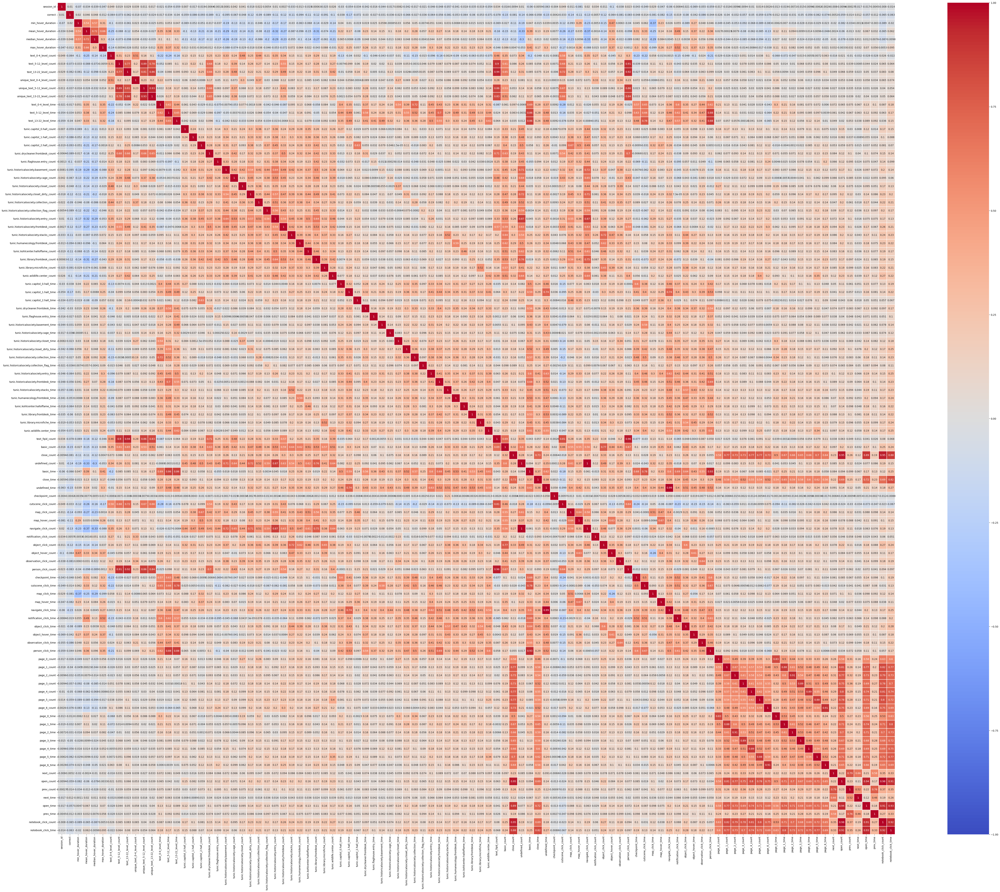

In [49]:
plt.figure(figsize=(75, 60))
_ = sns.heatmap(merged.corr(), annot=True, fmt='.2g', cmap='coolwarm', linewidths=0.25, vmin=-1, vmax=1, center= 0)

Лучше открыть график отдельно, дабы рассмотреть каждый интересующий признак.

In [50]:
# удалим признаки,которые имеют высокую степень корреляции с другими
merged = merged.drop(['text_fqid_count', 'undefined_count'], axis=1)

На самом деле, можно не удалять признаки, так как модель RandomForestClassifier не чувстительна к мультиколлинеарности.

In [51]:
print(merged.shape)
print(merged.shape[0] / 18)

(141228, 101)
7846.0


Итак у нас есть датасет, которые можно передать модели для обучения. Он содержит информацию о 7846 сессиий по 101 признакe для каждой.

### Построение модели

In [52]:
# отделим целевой признак
X = merged.drop(['correct'], axis=1)
y = merged[['correct']]

# выделим 30% данных на валидацию (параметр test_size)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [53]:
# обучим модель
model = RandomForestClassifier(random_state=42)
model.fit(X_train, y_train)

# сделаем предсказание
y_test_pred = model.predict(X_test)

# рассчитаем метрику f1 для тестовой выборки
print(f'f1_score на тестовом наборе: {metrics.f1_score(y_test, y_test_pred) :.3f}')

f1_score на тестовом наборе: 0.770


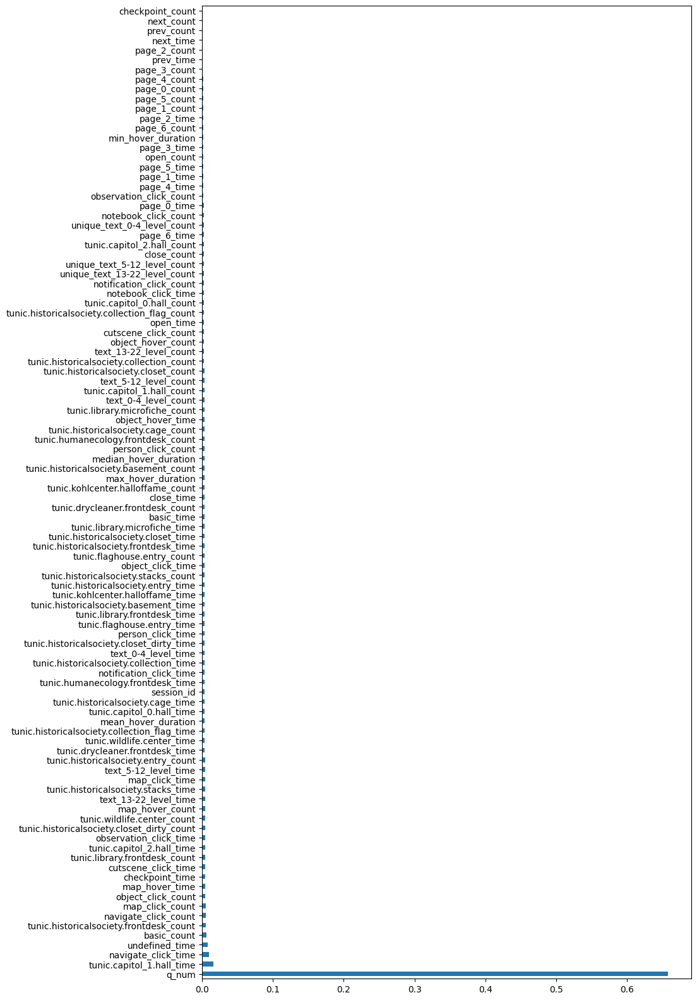

In [54]:
# посмотрим какие призаки оказали наибольшее влияние на модель
plt.rcParams['figure.figsize'] = (10, 20)
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
_ = feat_importances.nlargest(103).plot(kind='barh')

Кночено номер вопроса является тем признаком, который больше всего влияет на модель. И это не совсем корректно, однако об этом я подробнее напишу в общем выводе.

---

### Подбор гиперпараметров

In [55]:
def optuna_rf(trial):
    # задаем пространства поиска гиперпараметров
    n_estimators = trial.suggest_int('n_estimators', 100, 200, 2)
    max_depth = trial.suggest_int('max_depth', 5, 30, 1)
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 2, 10, 1)

    # создаем модель
    model = RandomForestClassifier(n_estimators=n_estimators,
                                   max_depth=max_depth,
                                   min_samples_leaf=min_samples_leaf,
                                   random_state=42)
    # обучаем модель
    model.fit(X_train, y_train)
    
    # применим  cross validation с тем же количеством фолдов
    score = cross_val_score(model, X_train, y_train, cv=5, scoring='f1', n_jobs=-1).mean()

    return score

# cоздаем объект исследования
# можем напрямую указать, что нам необходимо максимизировать метрику direction="maximize"
study = optuna.create_study(study_name='RandomForestClassifier', direction='maximize')
# ищем лучшую комбинацию гиперпараметров n_trials раз
study.optimize(optuna_rf, n_trials=10)

# выводим результаты на обучающей выборке
print(f'Наилучшие значения гиперпараметров {study.best_params}')

# рассчитаем точность для тестовой выборки
model = RandomForestClassifier(**study.best_params, random_state=42)
model.fit(X_train, y_train)

y_test_pred = model.predict(X_test)
print(f'f1_score на тестовом наборе: {metrics.f1_score(y_test, y_test_pred) :.3f}')

[I 2023-04-02 18:13:17,408] A new study created in memory with name: RandomForestClassifier
[I 2023-04-02 18:15:08,714] Trial 0 finished with value: 0.8339092935832181 and parameters: {'n_estimators': 130, 'max_depth': 29, 'min_samples_leaf': 10}. Best is trial 0 with value: 0.8339092935832181.
[I 2023-04-02 18:17:04,046] Trial 1 finished with value: 0.8393924068978738 and parameters: {'n_estimators': 170, 'max_depth': 13, 'min_samples_leaf': 3}. Best is trial 1 with value: 0.8393924068978738.
[I 2023-04-02 18:18:32,860] Trial 2 finished with value: 0.8384183799363738 and parameters: {'n_estimators': 118, 'max_depth': 16, 'min_samples_leaf': 10}. Best is trial 1 with value: 0.8393924068978738.
[I 2023-04-02 18:20:13,273] Trial 3 finished with value: 0.8408806178858681 and parameters: {'n_estimators': 154, 'max_depth': 13, 'min_samples_leaf': 9}. Best is trial 3 with value: 0.8408806178858681.
[I 2023-04-02 18:23:11,730] Trial 4 finished with value: 0.8148252669743357 and parameters: {'

Наилучшие значения гиперпараметров {'n_estimators': 154, 'max_depth': 13, 'min_samples_leaf': 9}
f1_score на тестовом наборе: 0.840


Подбор гиперпараметров помагает улучшить результат для целевой метрики.

---

### Использование альтернативной модели машинного обучения

In [56]:
X = merged.drop(['correct'], axis=1)
y = merged[['correct']]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

model_full = cat.CatBoostClassifier(verbose=False, random_state=42)
model_full.fit(X_train, y_train)
y_test_pred = model_full.predict(X_test)

print(f'f1_score на тестовом наборе общей модели: {metrics.f1_score(y_test, y_test_pred) :.3f}')

f1_score на тестовом наборе общей модели: 0.855


---

**Вывод:** Целевой метрикой для соревнования выбрана метрика F1. В результате работы модели с подобранными гиперпараметрами удалось получить значение для метрики - 0.84. Однако в данном ноутбуке сделана только базовая работа, призванная показать результаты обучения в онлайн-школе SkillFactory. Конечно же для повышения эффективности следует использовать не одну модель, а 18 разных, по одной на вопрос, тогда модель будет обучаться, подбирая параметры под конкретный вопрос. Этот подход я реализовал уже на платформе Kaggle. Так же кроме RandomForestClassifier можно и нужно испытывать модели из других библиотек, например такие как XGBoost или catboost. Руезультат работы catboost - 0.85.